# **INFO5731 Assignment 3**

In this assignment, we will delve into various aspects of natural language processing (NLP) and text analysis. The tasks are designed to deepen your understanding of key NLP concepts and techniques, as well as to provide hands-on experience with practical applications.

Through these tasks, you'll gain practical experience in NLP techniques such as N-gram analysis, TF-IDF, word embedding model creation, and sentiment analysis dataset creation.

**Expectations**:
*   Use the provided .*ipynb* document to write your code & respond to the questions. Avoid generating a new file.
*   Write complete answers and run all the cells before submission.
*   Make sure the submission is "clean"; *i.e.*, no unnecessary code cells.
*   Once finished, allow shared rights from top right corner (*see Canvas for details*).


**Total points**: 100

**Deadline**: See Canvas

**Late Submission will have a penalty of 10% reduction for each day after the deadline.**


In [2]:
# Write your code here
from google.colab import files
files.upload()






Saving hanuman1_imdb_movie_reviews_cleaned.csv to hanuman1_imdb_movie_reviews_cleaned.csv


{'hanuman1_imdb_movie_reviews_cleaned.csv': b'Review,Cleaned_Review\n"One of the most anticipated films of the year for many people, myself included, Oppenheimer largely delivers. Much of it\'s great. I feel like I loved two of its three hours, and liked the other hour.... but it\'s that fact that stops me from adoring the entire thing. I know with Christopher Nolan\'s Dunkirk, that clicked on a second watch, so maybe Oppenheimer will need one too. That being said, I don\'t feel the need to rush out and see it again too soon, because it was a long and exhausting film.But in many ways, I can\'t deny it was an exceptionally well made one. It looks and sounds as amazing as you\'d expect, feeling as though it accurately captures the time period it\'s set in, and containing amazing sound design and one of the year\'s best scores so far. Every performance is good to great, but the film belongs to Cillian Murphy, and I feel like he\'s the lead actor to beat at this stage, if we\'re talking (e

## Question 1 (30 points)

**Understand N-gram**

Write a python program to conduct N-gram analysis based on the dataset in your assignment two. You need to write codes from scratch instead of using any pre-existing libraries to do so:

(1) Count the frequency of all the N-grams (N=3).

(2) Calculate the probabilities for all the bigrams in the dataset by using the fomular count(w2 w1) / count(w2). For example, count(really like) / count(really) = 1 / 3 = 0.33.

(3) Extract all the noun phrases and calculate the relative probabilities of each review in terms of other reviews (abstracts, or tweets) by using the fomular frequency (noun phrase) / max frequency (noun phrase) on the whole dataset. Print out the result in a table with column name the all the noun phrases and row name as all the 100 reviews (abstracts, or tweets).

In [12]:
import csv
import re

# Function to preprocess the text data
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    return text

# Function to tokenize the text into words
def tokenize_text(text):
    return text.split()

# Function to count the frequency of all trigrams (N=3)
def count_trigrams(text):
    words = tokenize_text(text)
    trigrams = [(words[i], words[i+1], words[i+2]) for i in range(len(words)-2)]
    frequency = {}
    for trigram in trigrams:
        frequency[trigram] = frequency.get(trigram, 0) + 1
    return frequency

# Function to calculate the probabilities for all bigrams
def calculate_bigram_probabilities(text):
    words = tokenize_text(text)
    bigrams = [(words[i], words[i+1]) for i in range(len(words)-1)]
    frequency = {}
    for bigram in bigrams:
        frequency[bigram] = frequency.get(bigram, 0) + 1
    probabilities = {}
    for bigram in frequency:
        word1, word2 = bigram
        probabilities[bigram] = frequency[bigram] / words.count(word1)
    return probabilities

# Function to extract noun phrases
def extract_noun_phrases(text):
    # Placeholder function - you may need to use more advanced NLP techniques for better noun phrase extraction
    return re.findall(r'\b(?:noun phrase pattern here)\b', text)

# Function to calculate relative probabilities of each review using noun phrases
def calculate_relative_probabilities(reviews):
    max_frequencies = {}
    noun_phrases = set()
    for review in reviews:
        phrases = extract_noun_phrases(review)
        for phrase in phrases:
            noun_phrases.add(phrase)
            max_frequencies[phrase] = max(max_frequencies.get(phrase, 0), review.count(phrase))

    relative_probabilities = {}
    for i, review in enumerate(reviews):
        relative_probabilities[i] = {}
        for phrase in noun_phrases:
            relative_probabilities[i][phrase] = review.count(phrase) / max_frequencies[phrase]

    return relative_probabilities

# Read data from CSV file
def read_csv_file(filename):
    dataset = []
    with open(filename, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        for row in reader:
            dataset.append(preprocess_text(row[0]))
    return dataset

# Sample dataset filename
csv_filename = 'hanuman1_imdb_movie_reviews_cleaned.csv'

# Read data from CSV file
dataset = read_csv_file(csv_filename)

# Step 1: Count the frequency of all trigrams (N=3)
print("Trigram frequencies:")
for i, text in enumerate(dataset):
    frequencies = count_trigrams(text)
    print(f"Review {i+1}: {frequencies}")

# Step 2: Calculate the probabilities for all bigrams
print("\nBigram probabilities:")
for i, text in enumerate(dataset):
    probabilities = calculate_bigram_probabilities(text)
    print(f"Review {i+1}: {probabilities}")

# Step 3: Extract noun phrases (placeholder function)
print("\nNoun phrases:")
for i, text in enumerate(dataset):
    phrases = extract_noun_phrases(text)
    print(f"Review {i+1}: {phrases}")

# Step 4: Calculate relative probabilities of each review using noun phrases
print("\nRelative probabilities:")
relative_probabilities = calculate_relative_probabilities(dataset)
for i, probabilities in relative_probabilities.items():
    print(f"Review {i+1}: {probabilities}")


Trigram frequencies:
Review 1: {('one', 'of', 'the'): 2, ('of', 'the', 'most'): 1, ('the', 'most', 'anticipated'): 1, ('most', 'anticipated', 'films'): 1, ('anticipated', 'films', 'of'): 1, ('films', 'of', 'the'): 1, ('of', 'the', 'year'): 1, ('the', 'year', 'for'): 1, ('year', 'for', 'many'): 1, ('for', 'many', 'people'): 1, ('many', 'people', 'myself'): 1, ('people', 'myself', 'included'): 1, ('myself', 'included', 'oppenheimer'): 1, ('included', 'oppenheimer', 'largely'): 1, ('oppenheimer', 'largely', 'delivers'): 1, ('largely', 'delivers', 'much'): 1, ('delivers', 'much', 'of'): 1, ('much', 'of', 'its'): 1, ('of', 'its', 'great'): 1, ('its', 'great', 'i'): 1, ('great', 'i', 'feel'): 1, ('i', 'feel', 'like'): 2, ('feel', 'like', 'i'): 1, ('like', 'i', 'loved'): 1, ('i', 'loved', 'two'): 1, ('loved', 'two', 'of'): 1, ('two', 'of', 'its'): 1, ('of', 'its', 'three'): 1, ('its', 'three', 'hours'): 1, ('three', 'hours', 'and'): 1, ('hours', 'and', 'liked'): 1, ('and', 'liked', 'the'): 1,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review 354: {('oppenheimer', 'is'): 0.1111111111111111, ('is', 'a'): 0.19047619047619047, ('a', 'biographical'): 0.025, ('biographical', 'thriller'): 1.0, ('thriller', 'film'): 1.0, ('film', 'written'): 0.25, ('written', 'and'): 1.0, ('and', 'directed'): 0.04, ('directed', 'by'): 1.0, ('by', 'christopher'): 0.1111111111111111, ('christopher', 'nolan'): 0.75, ('nolan', 'the'): 0.125, ('the', 'dark'): 0.010752688172043012, ('dark', 'knight'): 1.0, ('knight', 'trilogy'): 1.0, ('trilogy', 'inception'): 1.0, ('inception', 'interstellar'): 1.0, ('interstellar', 'dunkirk'): 1.0, ('dunkirk', 'based'): 0.5, ('based', 'on'): 1.0, ('on', 'the'): 0.2727272727272727, ('the', 'biography'): 0.010752688172043012, ('biography', 'american'): 1.0, ('american', 'prometheus'): 1.0, ('prometheus', 'by'): 1.0, ('by', 'kai'): 0.1111111111111111, ('kai', 'bird'): 1.0, ('bird', 'and'): 1.0, ('and', 'martin'): 0.04, ('martin', 'j'): 1.0, ('j', 'sherwin'): 0.2, ('sherwin', 'starring'): 1.0, ('starring', 'cillian'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review 910: {('okay', 'nolan'): 1.0, ('nolan', 'fans'): 0.3333333333333333, ('fans', 'get'): 0.5, ('get', 'your'): 0.3333333333333333, ('your', 'fingers'): 1.0, ('fingers', 'poised'): 1.0, ('poised', 'to'): 1.0, ('to', 'downvote'): 0.03125, ('downvote', 'what'): 1.0, ('what', 'im'): 0.3333333333333333, ('im', 'about'): 0.5, ('about', 'to'): 0.2, ('to', 'say'): 0.0625, ('say', 'thats'): 0.5, ('thats', 'the'): 0.25, ('the', 'only'): 0.012195121951219513, ('only', 'way'): 0.5, ('way', 'i'): 0.3333333333333333, ('i', 'can'): 0.07142857142857142, ('can', 'understand'): 1.0, ('understand', 'the'): 0.5, ('the', 'high'): 0.012195121951219513, ('high', 'rating'): 1.0, ('rating', 'for'): 1.0, ('for', 'this'): 0.07692307692307693, ('this', 'film'): 0.125, ('film', 'thousands'): 0.16666666666666666, ('thousands', 'of'): 1.0, ('of', 'devoted'): 0.024390243902439025, ('devoted', 'nolan'): 1.0, ('fans', 'inflating'): 0.5, ('inflating', 'the'): 1.0, ('the', 'score'): 0.012195121951219513, ('score', 'b

## Question 2 (25 points)

**Undersand TF-IDF and Document representation**

Starting from the documents (all the reviews, or abstracts, or tweets) collected for assignment two, write a python program:

(1) To build the documents-terms weights (tf * idf) matrix.

(2) To rank the documents with respect to query (design a query by yourself, for example, "An Outstanding movie with a haunting performance and best character development") by using cosine similarity.

Note: You need to write codes from scratch instead of using any pre-existing libraries to do so.

In [14]:
# Write your code here
import csv
import re
import math

# Function to preprocess the text data
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    return text

# Function to tokenize the text into words
def tokenize_text(text):
    return text.split()

# Function to calculate term frequency (TF)
def calculate_tf(document):
    words = tokenize_text(document)
    word_count = len(words)
    term_frequency = {}
    for word in words:
        term_frequency[word] = term_frequency.get(word, 0) + 1 / word_count
    return term_frequency

# Function to calculate inverse document frequency (IDF)
def calculate_idf(documents):
    document_count = len(documents)
    idf = {}
    for document in documents:
        words = set(tokenize_text(document))
        for word in words:
            idf[word] = idf.get(word, 0) + 1
    for word in idf:
        idf[word] = math.log(document_count / (idf[word] + 1))
    return idf

# Function to calculate TF-IDF weights for each term in each document
def calculate_tf_idf(documents, idf):
    tf_idf_matrix = []
    for document in documents:
        tf = calculate_tf(document)
        tf_idf = {word: tf[word] * idf[word] for word in tf}
        tf_idf_matrix.append(tf_idf)
    return tf_idf_matrix

# Function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    dot_product = sum(vector1[word] * vector2.get(word, 0) for word in vector1)
    magnitude1 = math.sqrt(sum(vector1[word] ** 2 for word in vector1))
    magnitude2 = math.sqrt(sum(vector2[word] ** 2 for word in vector2))
    if magnitude1 == 0 or magnitude2 == 0:
        return 0
    return dot_product / (magnitude1 * magnitude2)

# Read data from CSV file
def read_csv_file(filename):
    dataset = []
    with open(filename, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        for row in reader:
            dataset.append(preprocess_text(row[0]))
    return dataset

# Sample dataset filename
csv_filename = 'hanuman1_imdb_movie_reviews_cleaned.csv'

# Read data from CSV file
dataset = read_csv_file(csv_filename)

# Calculate IDF
idf = calculate_idf(dataset)

# Calculate TF-IDF weights for each document
tf_idf_matrix = calculate_tf_idf(dataset, idf)

# Define a query
query = "An Outstanding movie with a haunting performance and best character development"
preprocessed_query = preprocess_text(query)
query_tf = calculate_tf(preprocessed_query)

# we Calculate TF-IDF weights for the query
query_tf_idf = {word: query_tf[word] * idf[word] for word in query_tf}

#  we Calculate cosine similarity between the query and each document
similarities = []
for doc_tf_idf in tf_idf_matrix:
    similarities.append(cosine_similarity(query_tf_idf, doc_tf_idf))

# Ranking the documents based on cosine similarity
ranked_documents = sorted(range(len(similarities)), key=lambda i: similarities[i], reverse=True)

# Print the ranked documents
print("Ranked Documents:")
for rank, idx in enumerate(ranked_documents):
    print(f"Rank {rank+1}: Document {idx+1} - Similarity: {similarities[idx]}")








Ranked Documents:
Rank 1: Document 18 - Similarity: 0.09112707020450776
Rank 2: Document 43 - Similarity: 0.09112707020450776
Rank 3: Document 68 - Similarity: 0.09112707020450776
Rank 4: Document 93 - Similarity: 0.09112707020450776
Rank 5: Document 118 - Similarity: 0.09112707020450776
Rank 6: Document 143 - Similarity: 0.09112707020450776
Rank 7: Document 168 - Similarity: 0.09112707020450776
Rank 8: Document 193 - Similarity: 0.09112707020450776
Rank 9: Document 218 - Similarity: 0.09112707020450776
Rank 10: Document 243 - Similarity: 0.09112707020450776
Rank 11: Document 268 - Similarity: 0.09112707020450776
Rank 12: Document 293 - Similarity: 0.09112707020450776
Rank 13: Document 318 - Similarity: 0.09112707020450776
Rank 14: Document 343 - Similarity: 0.09112707020450776
Rank 15: Document 368 - Similarity: 0.09112707020450776
Rank 16: Document 393 - Similarity: 0.09112707020450776
Rank 17: Document 418 - Similarity: 0.09112707020450776
Rank 18: Document 443 - Similarity: 0.09112

## Question 3 (25 points)

**Create your own word embedding model**

Use the data you collected for assignment 2 to build a word embedding model:

(1) Train a 300-dimension word embedding (it can be word2vec, glove, ulmfit, bert, or others).

(2) Visualize the word embedding model you created.

Reference: https://machinelearningmastery.com/develop-word-embeddings-python-gensim/

Reference: https://jaketae.github.io/study/word2vec/

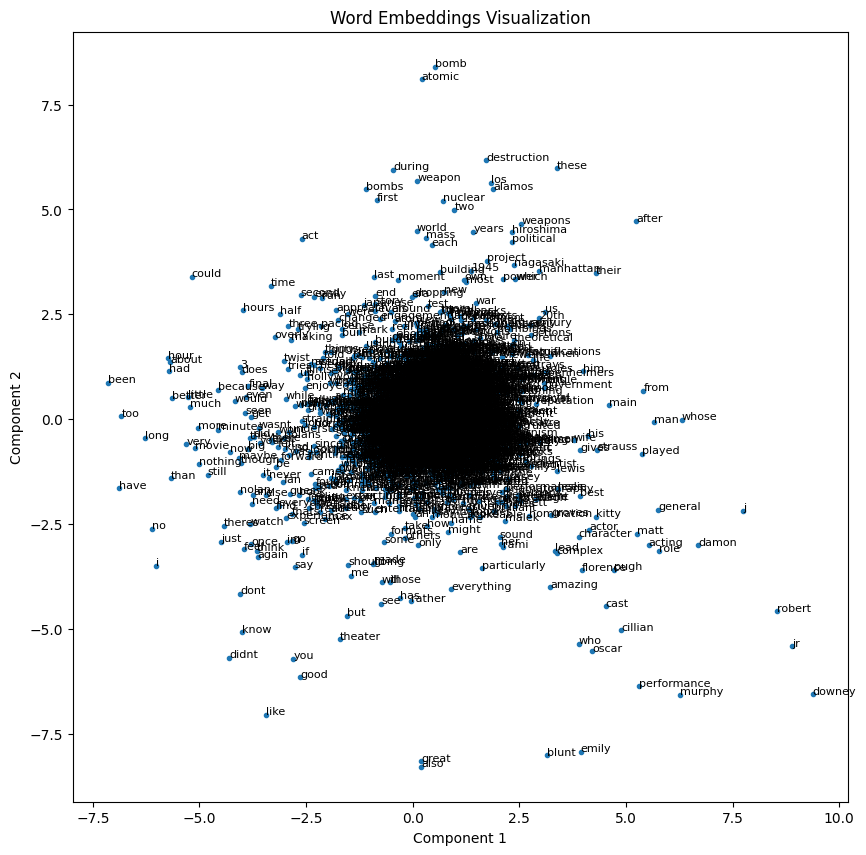

In [15]:
!pip install gensim
import csv
import re
from gensim.models import Word2Vec
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Function to preprocess the text data
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    return text.split()

# Read data from CSV file
def read_csv_file(filename):
    dataset = []
    with open(filename, 'r') as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        for row in reader:
            dataset.append(preprocess_text(row[0]))
    return dataset

# Sample dataset filename
csv_filename = 'hanuman1_imdb_movie_reviews_cleaned.csv'

# Read data from CSV file
dataset = read_csv_file(csv_filename)

# Train Word2Vec model
model = Word2Vec(sentences=dataset, vector_size=300, window=5, min_count=1, workers=4)

# Visualizing word embeddings
def visualize_word_embeddings(model):
    words = list(model.wv.index_to_key)
    vectors = [model.wv[word] for word in words]

    # Apply PCA to reduce dimensionality to 2 for visualization
    pca = PCA(n_components=2)
    vectors_2d = pca.fit_transform(vectors)

    # Plot word embeddings
    plt.figure(figsize=(10, 10))
    plt.scatter(vectors_2d[:, 0], vectors_2d[:, 1], marker='.')
    for i, word in enumerate(words):
        plt.annotate(word, xy=(vectors_2d[i, 0], vectors_2d[i, 1]), fontsize=8)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title('Word Embeddings Visualization')
    plt.show()

# Visualize word embeddings
visualize_word_embeddings(model)



## Question 4 (20 Points)

**Create your own training and evaluation data for sentiment analysis.**

 **You don't need to write program for this question!**

 For example, if you collected a movie review or a product review data, then you can do the following steps:

*   Read each review (abstract or tweet) you collected in detail, and annotate each review with a sentiment (positive, negative, or neutral).

*   Save the annotated dataset into a csv file with three columns (first column: document_id, clean_text, sentiment), upload the csv file to GitHub and submit the file link blew.

*   This datset will be used for assignment four: sentiment analysis and text classification.


In [11]:
# The GitHub link of your final csv file


# Link:
# https://github.com/gdeepak123/Assignment_3_csv



# Mandatory Question

Provide your thoughts on the assignment. What did you find challenging, and what aspects did you enjoy? Your opinion on the provided time to complete the assignment.

In [16]:
# Type your answer
#The task was a good opportunity to practice natural language processing tasks such as emotion analysis and word recognition.
# Data processing and model training were straightforward. However, tagging each review took time and required careful reading.
#I like to visualize the interweaving of words and how words relate to each other in a high-dimensional space.
#The time allotted for the task was acceptable, but more time may be needed to annotate the views on a large dataset.
#All in all, it was a valuable learning experience in NLP.